<a href="https://colab.research.google.com/github/KeisukeShimokawa/papers-challenge/blob/master/src/vae/cvae/notebooks/cvae.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi | head -n 10

Sun May 17 04:54:44 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+


In [2]:
!pip freeze | grep torch

torch==1.5.0+cu101
torchsummary==1.5.1
torchtext==0.3.1
torchvision==0.6.0+cu101


In [0]:
!rm -rf ./runs
!rm -rf *.png
!rm -rf *.mp4

In [0]:
%load_ext tensorboard

In [0]:
import os
import re
import glob
import random
import dataclasses
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image

import torch
from torch import nn, optim
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torchsummary import summary

In [0]:
@dataclasses.dataclass(frozen=True)
class Config:
    # setting
    is_cuda: bool     = True
    seed: int         = 42
    # training
    lr: int           = 1e-3
    batch_size: int   = 256
    n_epochs: int     = 50
    log_interval: int = 50
    # dataset
    num_classes:int   = 10
    num_workers: int  = 4
    pin_memory: bool  = True
    # model
    nin: int          = 784
    nh: int           = 400
    nz: int           = 20

In [7]:
cfg = Config()
print(cfg)

Config(is_cuda=True, seed=42, lr=0.001, batch_size=256, n_epochs=50, log_interval=50, num_classes=10, num_workers=4, pin_memory=True, nin=784, nh=400, nz=20)


In [0]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [9]:
if cfg.is_cuda:
    print(f"set seed: {cfg.seed}")
    set_seed(cfg.seed)

set seed: 42


In [10]:
is_cuda = cfg.is_cuda and torch.cuda.is_available()
device = torch.device("cuda:0" if is_cuda else "cpu")
print(device)

cuda:0


In [0]:
def get_loader(cfg, mode, transform):
    assert mode in ["train", "test"], "set moode in ['train', 'test']"

    if mode == "train":
        loader = DataLoader(
            datasets.FashionMNIST("./data", train=True, download=True, transform=transform),
            batch_size=cfg.batch_size,
            shuffle=True,
            num_workers=cfg.num_workers,
            pin_memory=cfg.pin_memory
        )
    elif mode == "test":
        loader = DataLoader(
            datasets.FashionMNIST("./data", train=False, download=True, transform=transform),
            batch_size=cfg.batch_size,
            shuffle=False,
            num_workers=cfg.num_workers,
            pin_memory=cfg.pin_memory
        )

    return loader

In [0]:
train_transforms = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize((0.5,), (0.5,))
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize((0.5,), (0.5,))
])

In [13]:
train_loader = get_loader(cfg, "train", train_transforms)
test_loader  = get_loader(cfg, "test",  test_transforms)

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw
Processing...
Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


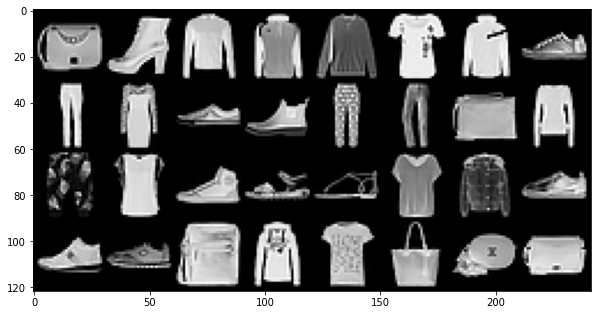

In [14]:
input, target = next(iter(train_loader))

plt.figure(figsize=(10, 10))
plt.imshow(make_grid(input[:32], nrow=8).permute(1, 2, 0).numpy())

In [15]:
target[:5]

tensor([8, 9, 2, 4, 2])

In [16]:
target.dtype

torch.int64

In [17]:
F.one_hot(target[:5], num_classes=cfg.num_classes)

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]])

In [0]:
class cVAE(nn.Module):
    def __init__(self, nin, nc, nh, nz):
        super(cVAE, self).__init__()

        self.fc1 = nn.Linear(nin + nc, nh)
        self.fc_mu  = nn.Linear(nh, nz)
        self.fc_logvar = nn.Linear(nh, nz)
        self.fc2 = nn.Linear(nz + nc, nh)
        self.fc3 = nn.Linear(nh, nin)

    def encode(self, x):
        # x: [batch_size, 784 + num_classes]
        h1 = F.relu(self.fc1(x))
        mu = self.fc_mu(h1)
        logvar = self.fc_logvar(h1)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def decode(self, z):
        # z: [batch_size, nz + num_classes]
        h2 = F.relu(self.fc2(z))
        recon = torch.sigmoid(self.fc3(h2))
        return recon

    def forward(self, x, c):
        # x:      [batch_size, 1, 28, 28]
        # c:      [batch_size, num_classes]
        # return: [batch_size, 784]

        # [B, 1, 28, 28] -> [B, 784]
        x = x.view(-1, 784).contiguous()
        # ([B, 784], [B, num_classes]) -> [B, 784 + num_classes]
        x = torch.cat((x, c), dim=-1)

        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)

        # ([B, nz], [B, num_classes]) -> [B, nz + num_classes]
        z = torch.cat((z, c), dim=-1)
        recon = self.decode(z)
        return recon, mu, logvar

In [0]:
model = cVAE(cfg.nin, cfg.num_classes, cfg.nh, cfg.nz)
model = model.to(device)

In [0]:
# summary(model, [(1, 28, 28), (10,)])

In [0]:
optimizer = optim.Adam(model.parameters(), lr=cfg.lr)

In [0]:
def criterion(recon_x, x, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction="sum")

    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5*torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return BCE + KLD

In [0]:
def train(loader, model, optimizer, epoch, log_interval, num_classes):
    model.train()
    train_loss = 0.0
    for batch_idx, (data, target) in enumerate(loader):
        data = data.to(device)
        target = F.one_hot(target, num_classes=num_classes).to(device, dtype=data.dtype)
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data, target)
        loss = criterion(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

        if batch_idx % cfg.log_interval == 0:
            print("Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                epoch, 
                batch_idx * len(data), 
                len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                loss.item() / len(data))
            )
            
    print("====> Epoch: {} Average loss: {:.4f}".format(
        epoch, train_loss / len(train_loader.dataset))
    )

In [0]:
def test(loader, model, epoch, writer, num_classes):
    model.eval()
    test_loss = 0
    batch_size = loader.batch_size
    with torch.no_grad():
        for i, (data, target) in enumerate(loader):
            data = data.to(device)
            target = F.one_hot(target, num_classes=num_classes).to(device, dtype=data.dtype)
            recon_batch, mu, logvar = model(data, target)
            test_loss += criterion(recon_batch, data, mu, logvar).item()
            if i == 0:
                n = min(data.size(0), 8)
                comparison = torch.cat([data[:n], recon_batch.view(batch_size, 1, 28, 28)[:n]])
                save_image(comparison.cpu(), "reconstruction_"+str(epoch)+".png", nrow=n)
                add_image_tensorboard(comparison.cpu(), epoch, writer, "recon")

    test_loss /= len(loader.dataset)
    print("====> Test set loss: {:.4f}".format(test_loss))

In [25]:
%tensorboard --logdir ./runs

<IPython.core.display.Javascript object>

In [0]:
def add_image_tensorboard(tensor, epoch, writer, label):
    grid_tensor = make_grid(tensor, padding=1, normalize=True)
    writer.add_image(label, grid_tensor, global_step=epoch)

In [27]:
writer = SummaryWriter()
sample_img_list = []
fixed_noise = torch.randn(cfg.batch_size, cfg.nz).to(device)
target = torch.randint(low=0, high=cfg.num_classes, size=(cfg.batch_size,))

for epoch in range(1, cfg.n_epochs):
    train(train_loader, model, optimizer, epoch, cfg.log_interval, cfg.num_classes)
    test(test_loader, model, epoch, writer, cfg.num_classes)

    with torch.no_grad():
        target_onehot = F.one_hot(target, num_classes=cfg.num_classes).to(device, dtype=fixed_noise.dtype)
        decode_input = torch.cat((fixed_noise, target_onehot), dim=-1)
        sample = model.decode(decode_input).detach().cpu()
        n = min(sample.size(0), 16)
        sample = sample[:n]

        save_image(sample.view(-1, 1, 28, 28), "sample_"+str(epoch)+".png")
        # add image to tensorboard
        add_image_tensorboard(
            sample.view(-1, 1, 28, 28), epoch, writer, "sample"
        )

Train Epoch: 1 [0/60000 (0%)]	Loss: 546.232666
Train Epoch: 1 [12800/60000 (21%)]	Loss: 314.040070
Train Epoch: 1 [25600/60000 (43%)]	Loss: 287.497559
Train Epoch: 1 [38400/60000 (64%)]	Loss: 276.174103
Train Epoch: 1 [51200/60000 (85%)]	Loss: 260.992859
====> Epoch: 1 Average loss: 299.4256
====> Test set loss: 267.0724
Train Epoch: 2 [0/60000 (0%)]	Loss: 268.808105
Train Epoch: 2 [12800/60000 (21%)]	Loss: 259.140381
Train Epoch: 2 [25600/60000 (43%)]	Loss: 260.897705
Train Epoch: 2 [38400/60000 (64%)]	Loss: 260.165466
Train Epoch: 2 [51200/60000 (85%)]	Loss: 249.579315
====> Epoch: 2 Average loss: 260.1365
====> Test set loss: 257.4313
Train Epoch: 3 [0/60000 (0%)]	Loss: 258.126282
Train Epoch: 3 [12800/60000 (21%)]	Loss: 259.121643
Train Epoch: 3 [25600/60000 (43%)]	Loss: 249.408676
Train Epoch: 3 [38400/60000 (64%)]	Loss: 251.712616
Train Epoch: 3 [51200/60000 (85%)]	Loss: 251.971695
====> Epoch: 3 Average loss: 253.1225
====> Test set loss: 253.0904
Train Epoch: 4 [0/60000 (0%)]	L

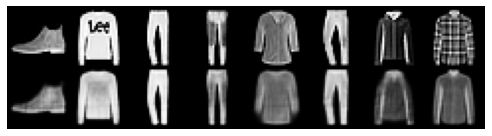

In [28]:
recon_img_list = sorted(glob.glob("reconstruction_*.png"),
                        key=lambda s: int(re.search(r"\d+", s).group()))

fig = plt.figure(figsize=(8, 2), tight_layout=True)
plt.axis("off")
ims = [[plt.imshow(Image.open(img_path), animated=True)] for img_path in recon_img_list]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
ani.save("reconstructions.mp4", writer="ffmpeg")

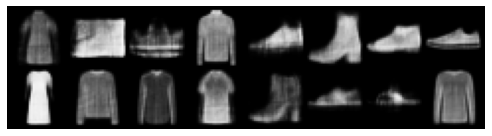

In [30]:
recon_img_list = sorted(glob.glob("sample_*.png"),
                        key=lambda s: int(re.search(r"\d+", s).group()))

fig = plt.figure(figsize=(8, 2), tight_layout=True)
plt.axis("off")
ims = [[plt.imshow(Image.open(img_path), animated=True)] for img_path in recon_img_list]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
ani.save("samples.mp4", writer="ffmpeg")